# Image Classification and Analysis
### Disease Classification 

In [ ]:
# Importing the required libraries

import os 
import numpy as np 
import pandas as pd 
import cv2
import random
import matplotlib.pyplot as plt 
import seaborn as sns 
import matplotlib.cm as cm
# CNN Libraries 
import tensorflow as tf 
from tensorflow.keras import layers, models 
from tensorflow.keras.preprocessing import image_dataset_from_directory 
from tensorflow.keras.utils import to_categorical 
from tensorflow.keras.applications import MobileNetV2, ResNet50 
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau 
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing import image


# Classic ML Libraries 
from sklearn.model_selection import train_test_split, GridSearchCV 
from sklearn.preprocessing import StandardScaler 
from sklearn.svm import SVC 
from sklearn.ensemble import RandomForestClassifier 
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score, precision_score, f1_score 
from skimage.transform import resize  
import glob



## 1. Data Loading & Preparation
Setting random seed for reproducibility, loading the dataset

In [ ]:
# Set random seed for reproducibility 
RANDOM_STATE = 126233 
# Path to the folder containing the images 
FOLDER_PATH = "PV" 
# Batch size for training 
BATCH_SIZE = 16 
# Image size 
IMAGE_SIZE = 128


In [ ]:
#Loading the data

#Train Data
train_data = image_dataset_from_directory( 
            FOLDER_PATH, 
            image_size=IMAGE_SIZE, 
            batch_size=BATCH_SIZE, 
            validation_split=0.2, 
            subset="training", 
            seed=RANDOM_STATE ) 

#Validation (Test) Data
val_data = image_dataset_from_directory( 
            FOLDER_PATH, 
            image_size=IMAGE_SIZE, 
            batch_size=BATCH_SIZE, 
            validation_split=0.2, 
            subset="validation", 
            seed=RANDOM_STATE ) 

print("\n Data loaded successfully")


Found 20252 files belonging to 15 classes.
Using 16202 files for training.
Found 20252 files belonging to 15 classes.
Using 4050 files for validation.

 Data loaded successfully


# EDA
Visualizing the data 

Classes: ['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy']


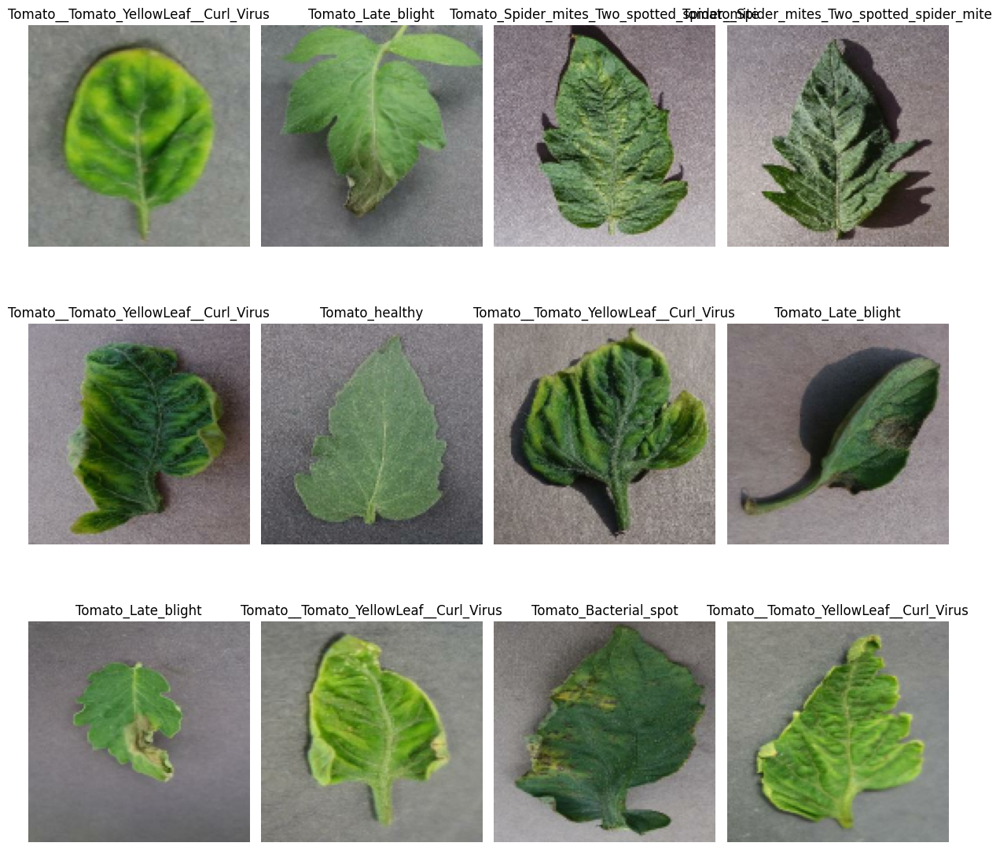


Image Count Per Class:
Pepper__bell___Bacterial_spot: 611
Pepper__bell___healthy: 1478
Potato___Early_blight: 1000
Potato___Late_blight: 1000
Potato___healthy: 152
Tomato_Bacterial_spot: 2127
Tomato_Early_blight: 1000
Tomato_Late_blight: 1909
Tomato_Leaf_Mold: 952
Tomato_Septoria_leaf_spot: 1771
Tomato_Spider_mites_Two_spotted_spider_mite: 1676
Tomato__Target_Spot: 1404
Tomato__Tomato_YellowLeaf__Curl_Virus: 3208
Tomato__Tomato_mosaic_virus: 373
Tomato_healthy: 1591

Total images: 20252

Class Distribution:


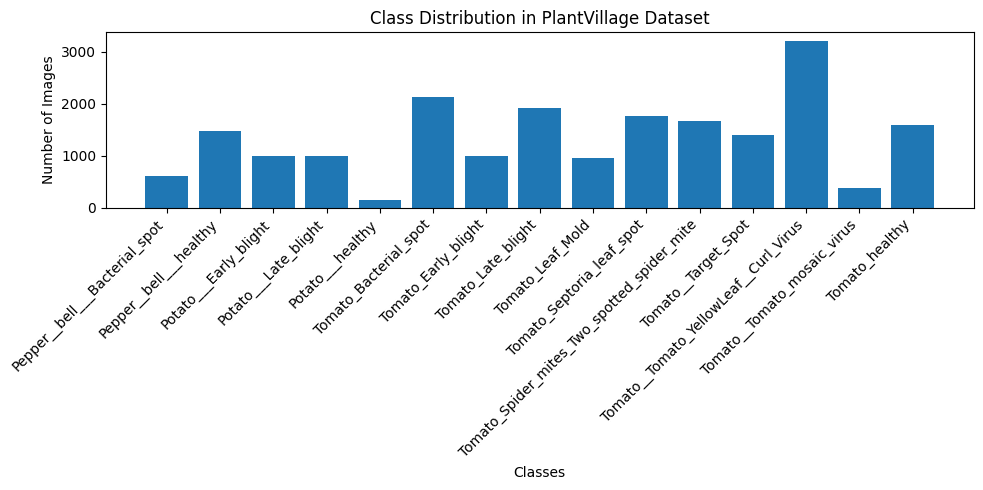

In [4]:
#EDA 

#Folder (Class) Names
class_names = train_data.class_names 
print("Classes:", class_names) # Get one batch from train_data 

# 1. Show images

images, labels = next(iter(train_data))

plt.figure(figsize=(12, 12)) 
for i in range(12): # show first 12 images 
    plt.subplot(3, 4, i+1) 
    plt.imshow(images[i].numpy().astype("uint8")) 
    plt.title(class_names[labels[i]]) 
    plt.axis("off") 
plt.tight_layout() 
plt.show()

class_names = train_data.class_names
# images, labels = next(iter(train_data))

# 2. Count images per class folder
class_counts = {}
for cls in class_names:
    cls_path = os.path.join(FOLDER_PATH, cls)
    num_images = len([
        f for f in os.listdir(cls_path)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ])
    class_counts[cls] = num_images

print("\nImage Count Per Class:")
for cls, count in class_counts.items():
    print(f"{cls}: {count}")

# 3. Total images
total_images = sum(class_counts.values())
print("\nTotal images:", total_images)

print("\nClass Distribution:")

# 4. Bar plot of class distribution
plt.figure(figsize=(10,5))
plt.bar(class_counts.keys(), class_counts.values())
plt.xticks(rotation=45, ha='right')
plt.xlabel("Classes")
plt.ylabel("Number of Images")
plt.title("Class Distribution in PlantVillage Dataset")
plt.tight_layout()
plt.show()


# Preprocessing Data for CNN model
Preprocessing the data for training the cnn model via data augmentation, scaling and autotuning 

In [5]:
#CNN Preprocessing, suitable for MobileNetV2


def preprocessing_CNN(train_data, val_data):

    # Data augmentation (train only)
    data_augmentation = tf.keras.Sequential([
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(0.1),
        layers.RandomContrast(0.1),
    ])

    AUTOTUNE = tf.data.AUTOTUNE

    train_data = train_data.map(
        lambda x, y: (data_augmentation(x, training=True), y),
        num_parallel_calls=AUTOTUNE
    )

    train_data = train_data.map(
        lambda x, y: (preprocess_input(x), y),
        num_parallel_calls=AUTOTUNE
    )

    val_data = val_data.map(
        lambda x, y: (preprocess_input(x), y),
        num_parallel_calls=AUTOTUNE
    )

    train_data = train_data.prefetch(AUTOTUNE)
    val_data = val_data.cache().prefetch(AUTOTUNE)

    return train_data, val_data

print("Preprocessing piepline for CNN created")


Preprocessing piepline for CNN created


In [6]:
# Metric Dictionary
def metric_dict(y_true, y_pred): 
    metrics = { "Accuracy": accuracy_score(y_true, y_pred), 
        "Precision": precision_score(y_true, y_pred, average="weighted"), 
        "Recall": recall_score(y_true, y_pred, average="weighted"), 
        "F1-Score": f1_score(y_true, y_pred, average="weighted") } 
    cm = confusion_matrix(y_true, y_pred) 
    return metrics, cm

print("Metric Dictionary function created, for Metrics and Confusion Matrix")


Metric Dictionary function created, for Metrics and Confusion Matrix


In [7]:
train_data_cnn, val_data_cnn = preprocessing_CNN(train_data, val_data)
print("Preprocessing Data for CNN, completed")

Preprocessing Data for CNN, completed


# Creating the CNN model 
CNN model pretrained model: MobileNetV2 

In [8]:
# Load Pretrained Model
pretrained_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
pretrained_model.trainable = False

print("Pretrained Model Loaded: MobileNetV2")

Pretrained Model Loaded: MobileNetV2


In [9]:
#CNN Model


cnn_model = models.Sequential([
    pretrained_model,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.5),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.4),
    layers.Dense(len(class_names), activation='softmax')
])
for layer in pretrained_model.layers[-30:]:
    layer.trainable = True


cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

print("\n CNN  compiled, printing model summary: ")
print(cnn_model.summary())

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy', patience=5, restore_best_weights=True
)
    



 CNN  compiled, printing model summary: 


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_128            │ (None, 4, 4, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 15)             │         7,695 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,921,551 (11.14 MB)

 Trainable params: 2,189,967 (8.35 MB)

 Non-trainable params: 731,584 (2.79 MB)

None


In [16]:
history = cnn_model.fit(
    train_data_cnn,
    epochs=15,
    validation_data=val_data_cnn,
    callbacks = [early_stopping]
)
#See GPU Usage 

Epoch 1/15
1013/1013 ━━━━━━━━━━━━━━━━━━━━ 90s 89ms/step - accuracy: 0.9087 - loss: 0.2739 - val_accuracy: 0.9328 - val_loss: 0.1954
Epoch 2/15
1013/1013 ━━━━━━━━━━━━━━━━━━━━ 88s 86ms/step - accuracy: 0.9090 - loss: 0.2692 - val_accuracy: 0.9365 - val_loss: 0.1810
Epoch 3/15
1013/1013 ━━━━━━━━━━━━━━━━━━━━ 88s 87ms/step - accuracy: 0.9150 - loss: 0.2564 - val_accuracy: 0.9398 - val_loss: 0.1807
Epoch 4/15
1013/1013 ━━━━━━━━━━━━━━━━━━━━ 87s 86ms/step - accuracy: 0.9159 - loss: 0.2478 - val_accuracy: 0.9380 - val_loss: 0.1818
Epoch 5/15
1013/1013 ━━━━━━━━━━━━━━━━━━━━ 87s 86ms/step - accuracy: 0.9204 - loss: 0.2402 - val_accuracy: 0.9405 - val_loss: 0.1745
Epoch 6/15
1013/1013 ━━━━━━━━━━━━━━━━━━━━ 87s 86ms/step - accuracy: 0.9253 - loss: 0.2220 - val_accuracy: 0.9440 - val_loss: 0.1654
Epoch 7/15
1013/1013 ━━━━━━━━━━━━━━━━━━━━ 88s 87ms/step - accuracy: 0.9277 - loss: 0.2097 - val_accuracy: 0.9422 - val_loss: 0.1735
Epoch 8/15
1013/1013 ━━━━━━━━━━━━━━━━━━━━ 88s 86ms/step - accuracy: 0.9290 -

In [17]:
loss,accuracy = cnn_model.evaluate(val_data_cnn)
print(f"Validation Accuracy: {accuracy*100:.2f}%")

254/254 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.9514 - loss: 0.1405
Validation Accuracy: 95.14%


# Visualising the meteics of CNN model

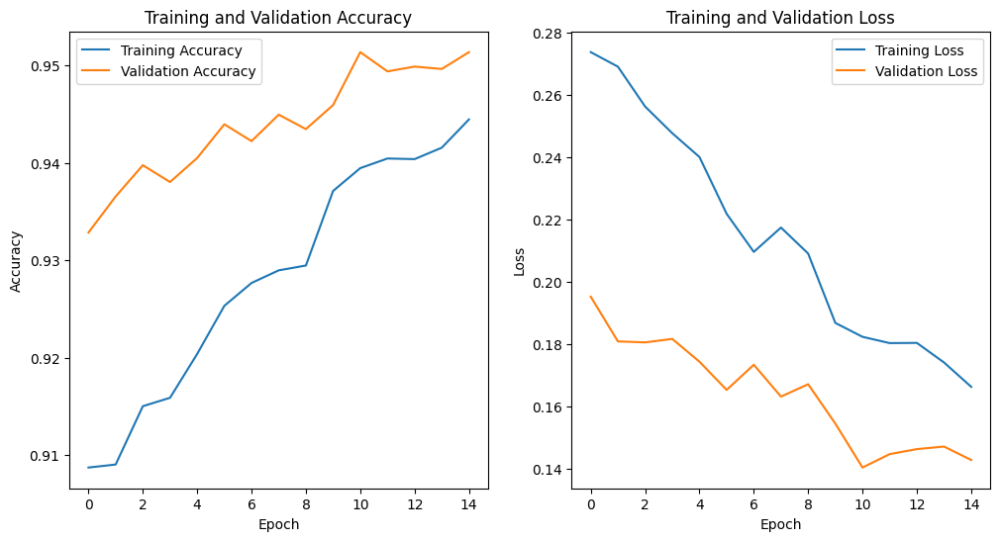

In [18]:
#Visualization of model performance

#Train Accuracy v loss curve
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()



 Showing Confusion Matrix for CNN
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━

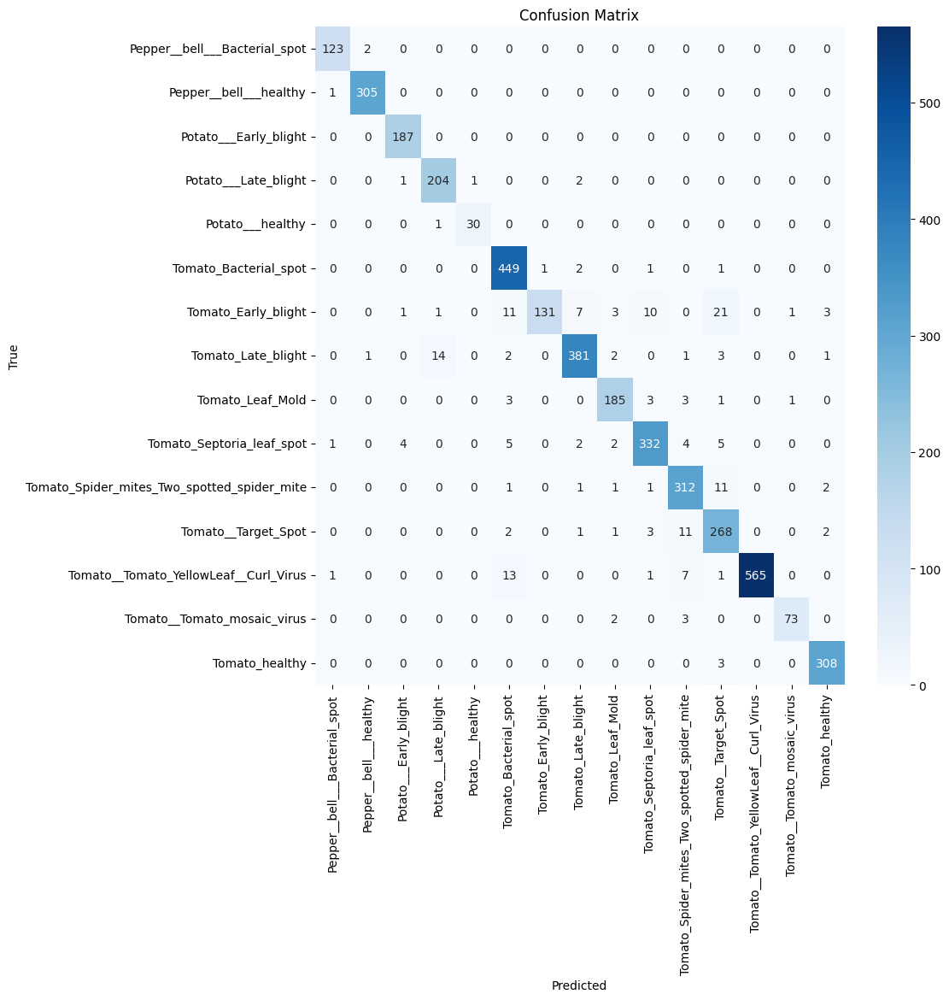


 Showing Metrics Report for CNN


,0
Accuracy,0.9514
Precision,0.9532
Recall,0.9514
F1-Score,0.9506


In [19]:
# Confusion Matrix, Metrics Report for CNN 

print("\n Showing Confusion Matrix for CNN")
y_true = []
y_pred = []

for images, labels in val_data_cnn: 
    preds = cnn_model.predict(images)
    preds = np.argmax(preds, axis=1)
    y_true.extend(labels.numpy())
    y_pred.extend(preds)


cnn_metrics, cm = metric_dict(y_true, y_pred)
plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


cnn_metrics_df = pd.DataFrame([cnn_metrics]).T.round(4)
print("\n Showing Metrics Report for CNN")
display(cnn_metrics_df)


# Preprocessing the dataset for Classical models

In [20]:
#Preocessing Pipeline for Classical Models

def dataset_to_numpy(dataset):
    images = []
    labels = []
    for batch_images, batch_labels in dataset: 
        images.extend(batch_images.numpy().astype("uint8"))
        labels.extend(batch_labels.numpy())
    return np.array(images), np.array(labels)

def extract_color_histogram(images, bins=(8, 8, 8)):
    hist_features = []
    for img in images:
        if not isinstance(img, np.ndarray):
            img = img.numpy()
        # Ensure uint8
        if img.dtype != np.uint8:
            img = (img * 255).astype("uint8") if img.max() <= 1.0 else img.astype("uint8")

        # Compute histogram
        hist = cv2.calcHist([img], [0, 1, 2], None, bins,[0, 256, 0, 256, 0, 256])
        cv2.normalize(hist, hist)

        hist_features.append(hist.flatten())

    return np.array(hist_features)

print ("Classical Model Pipeline Created")
train_images, train_labels = dataset_to_numpy(train_data)
val_images, val_labels = dataset_to_numpy(val_data)

X_train = extract_color_histogram(train_images)
X_val = extract_color_histogram(val_images)
y_train = train_labels
y_val = val_labels

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)

print("\n Data Processed for Classical Models")




Classical Model Pipeline Created

 Data Processed for Classical Models


# Creating the Classical model pipeline and Visualizing the metrics


 Showing Confusion Matrix for  SVM


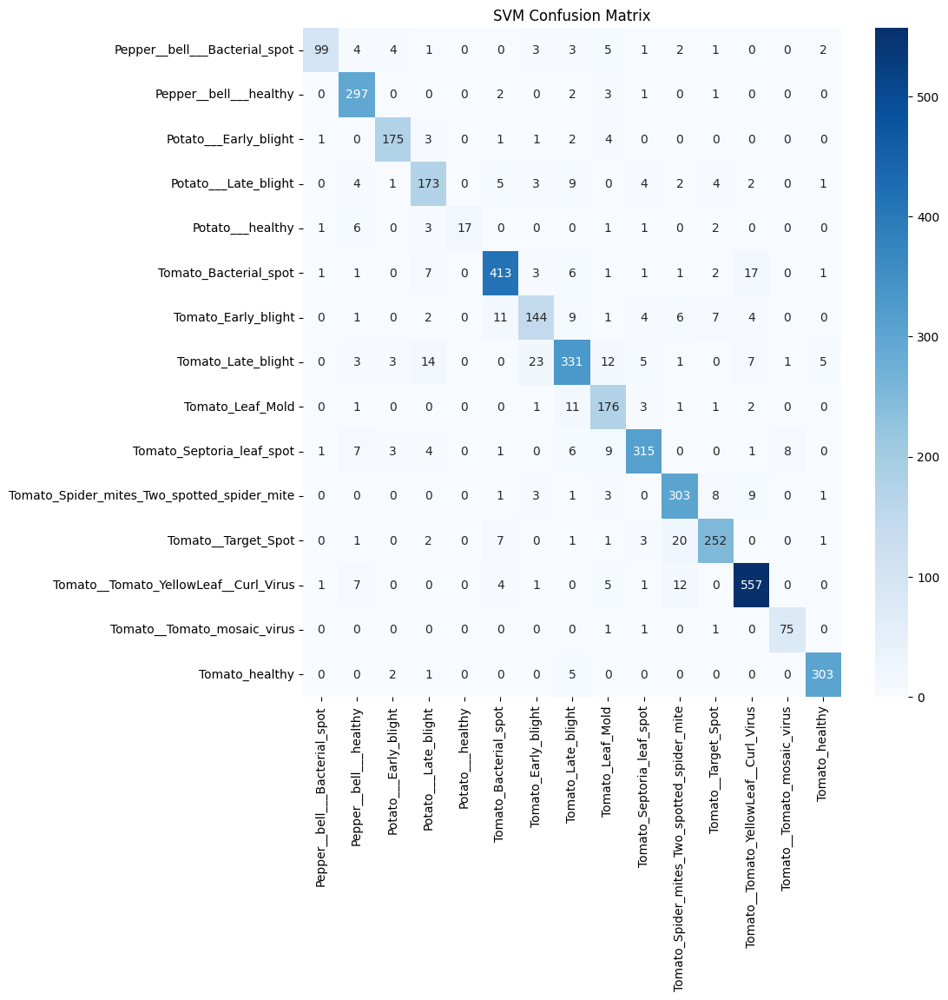


 Showing Confusion Matrix for  RandomForest


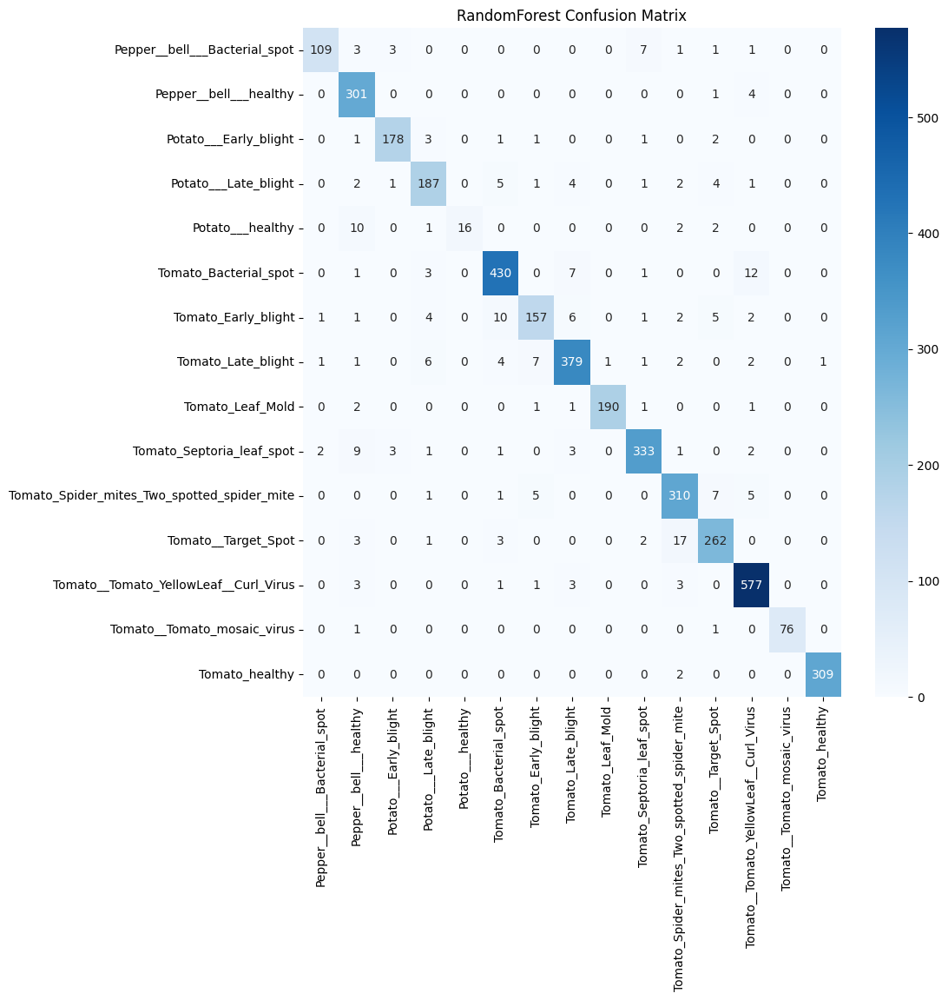


 Showing Confusion Matrix for  KNN


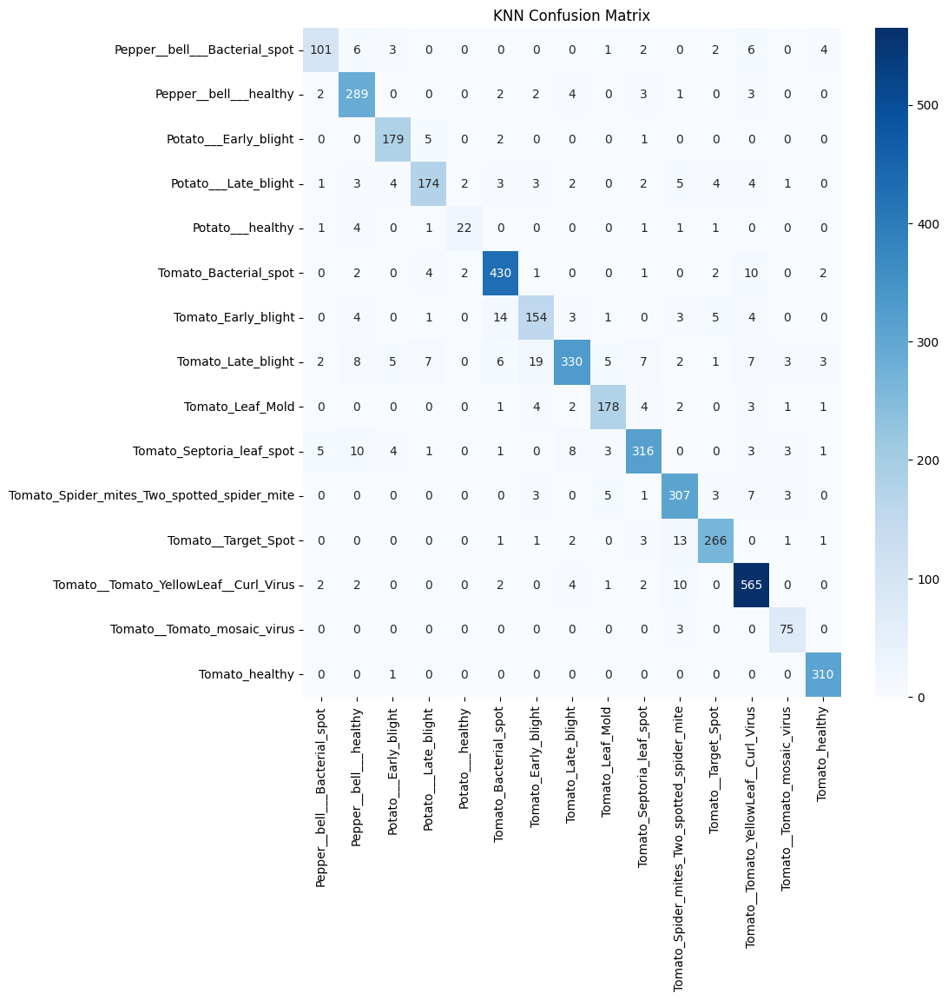

In [21]:
models_dict = {
    "SVM": SVC(),
    "RandomForest": RandomForestClassifier(),
    "KNN": KNeighborsClassifier()
}

model_performance = {}
trained_models = {}

for model_name, model in models_dict.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    metrics, cm = metric_dict(y_val, y_pred)
    model_performance[model_name] = metrics
    trained_models[model_name] = model

    plt.figure(figsize=(10, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title(f'{model_name} Confusion Matrix')
    print("\n Showing Confusion Matrix for ", model_name)
    plt.show()


# Visualisation and comparison of Classical models and CNN model

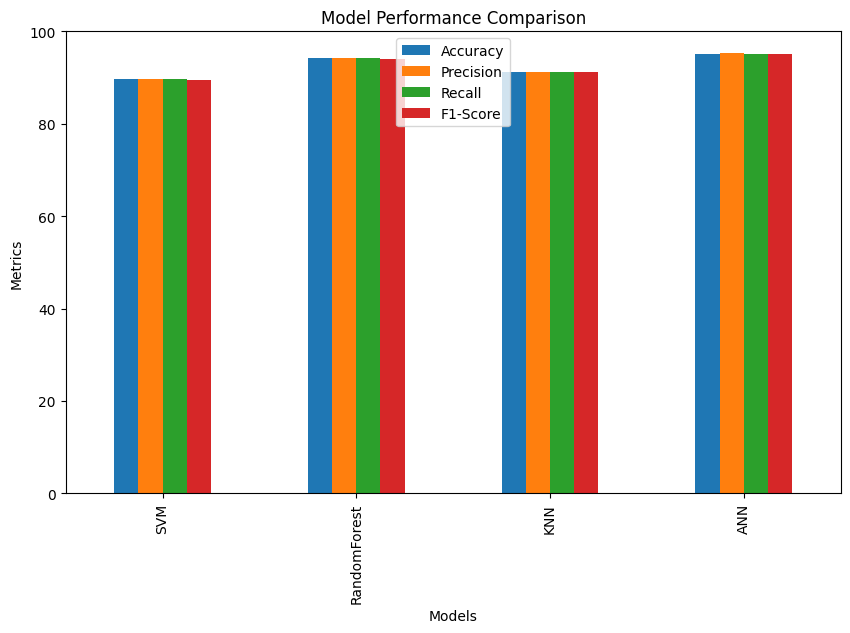

,Accuracy,Precision,Recall,F1-Score
SVM,89.63,89.75,89.63,89.57
RandomForest,94.17,94.25,94.17,94.11
KNN,91.26,91.28,91.26,91.18
ANN,95.14,95.32,95.14,95.06


In [22]:
performance_df = pd.DataFrame(model_performance).T.round(4)
performance_df.loc["ANN"] = cnn_metrics 
performance_df = (performance_df * 100).round(2)
performance_df.plot(kind="bar", figsize=(10, 6))
plt.title("Model Performance Comparison")
plt.xlabel("Models")
plt.ylabel("Metrics")
plt.ylim(0, 100)
plt.legend(loc="upper center")
plt.show()
display(performance_df)

In [23]:
#Saving the model
cnn_model.save('plantvillage_model.keras')
print("Model saved")

Model saved


# Feature Visualization using Grad-CAM 

Model loaded successfully from plantvillage_model.keras
Processing Pepper__bell___Bacterial_spot...


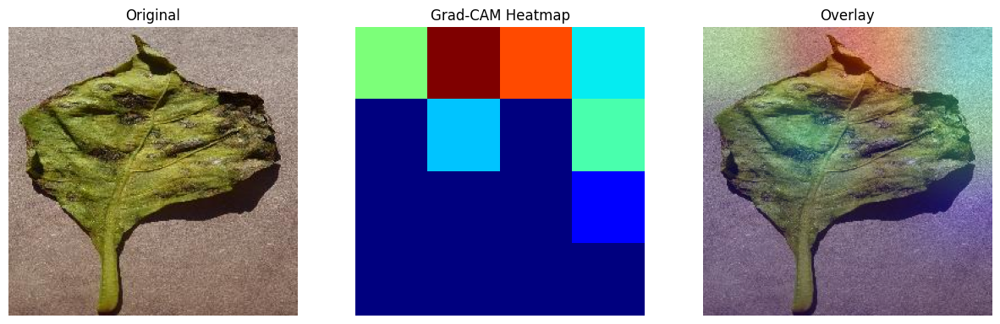

Processing Pepper__bell___healthy...


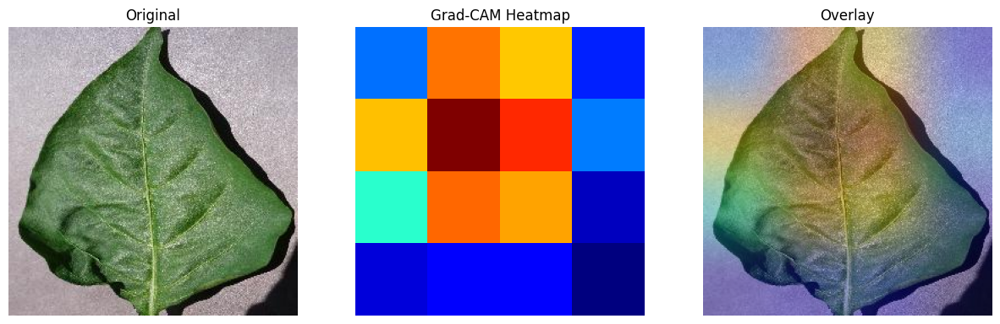

Processing Potato___Early_blight...


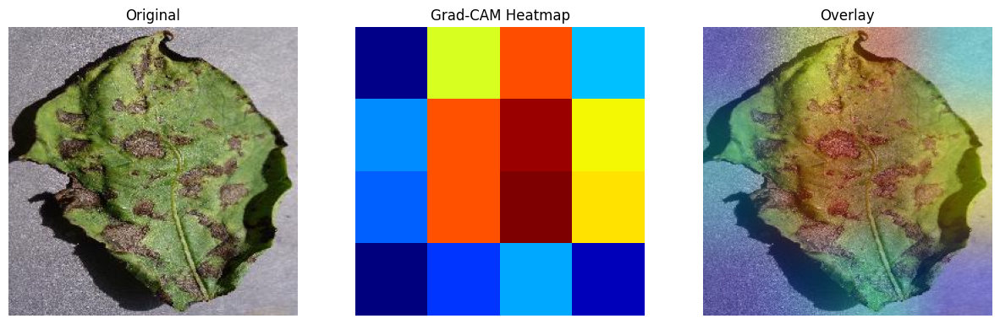

Processing Potato___healthy...


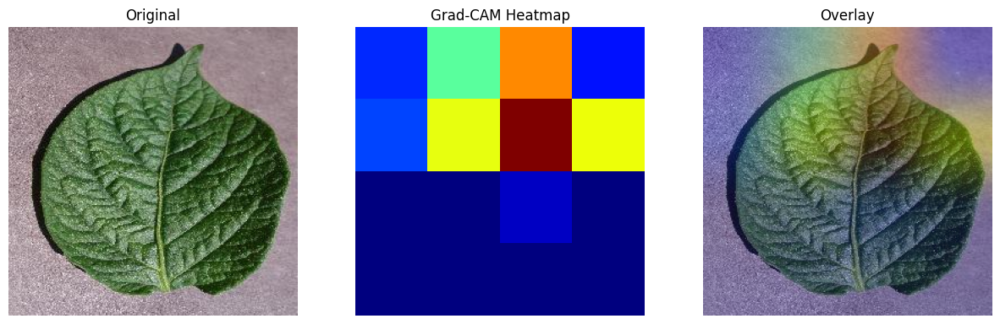

Processing Potato___Late_blight...


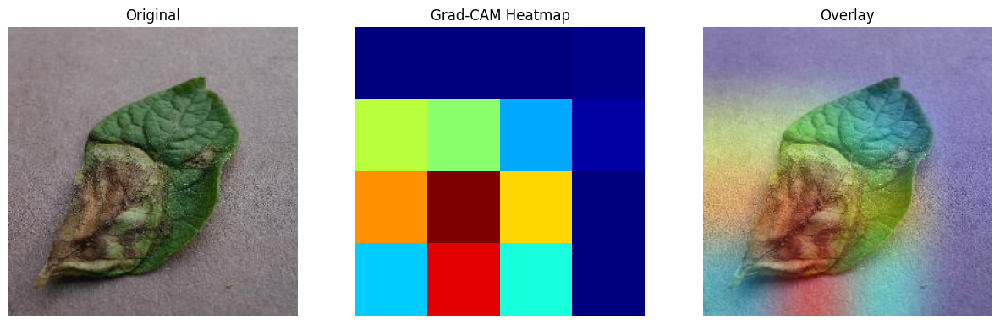

Processing Tomato_Bacterial_spot...


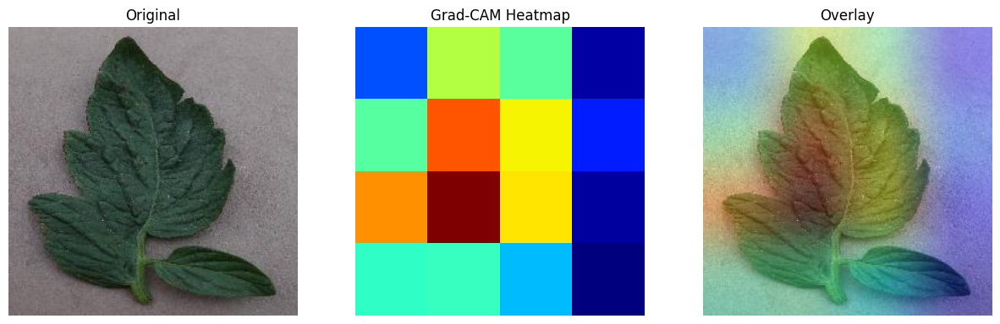

Processing Tomato_Early_blight...


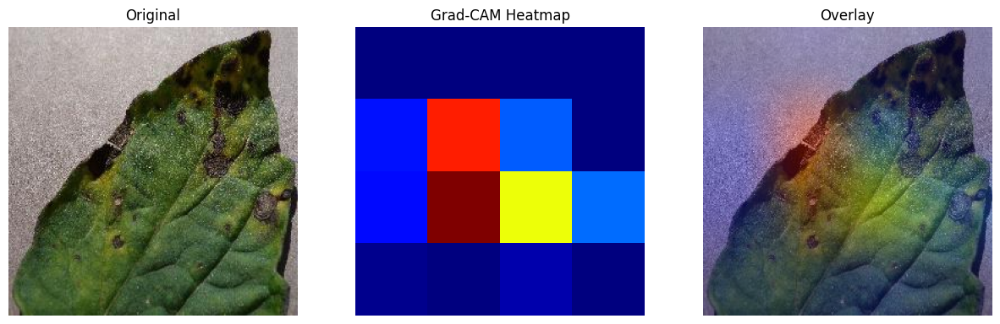

Processing Tomato_healthy...


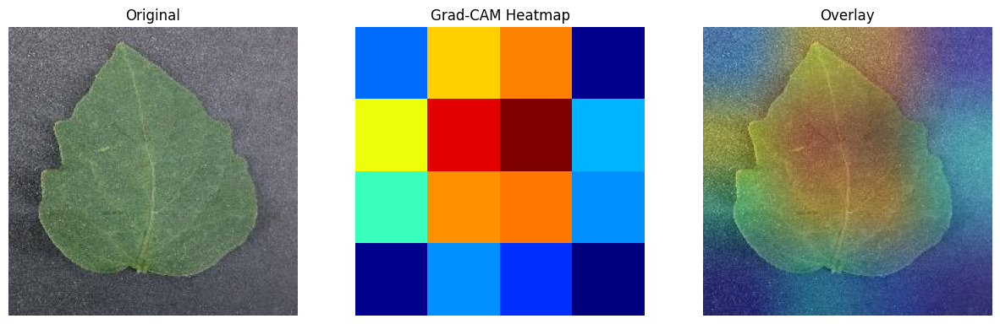

Processing Tomato_Late_blight...


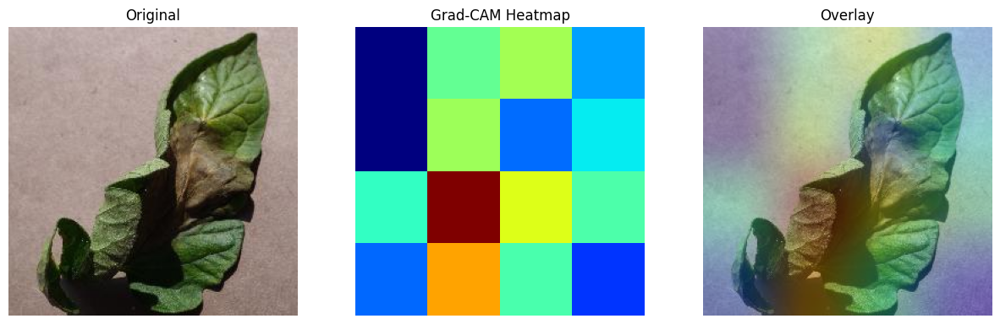

Processing Tomato_Leaf_Mold...


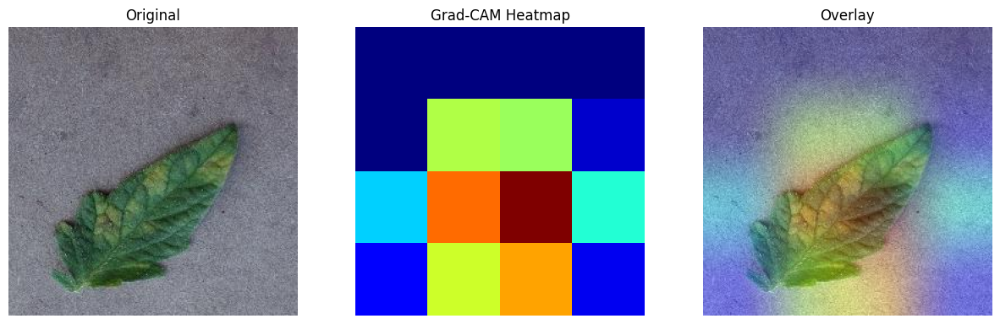

Processing Tomato_Septoria_leaf_spot...


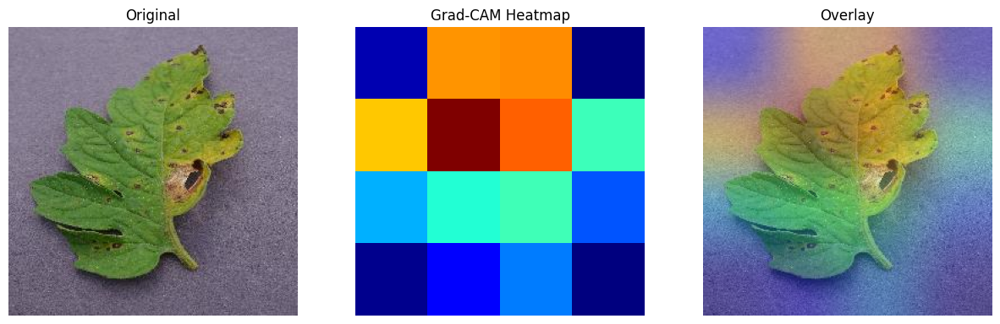

Processing Tomato_Spider_mites_Two_spotted_spider_mite...


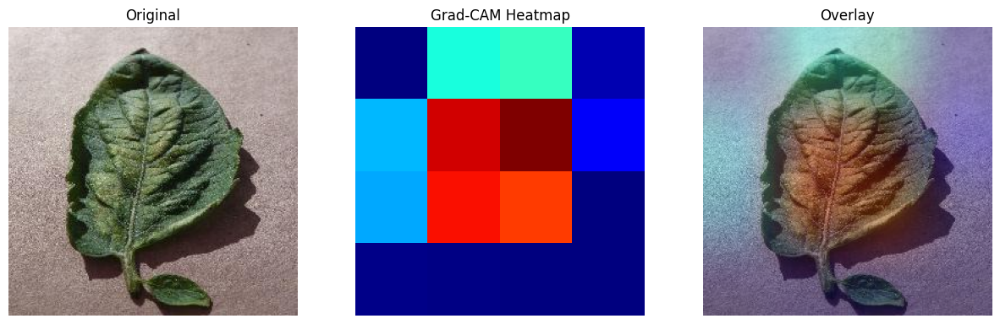

Processing Tomato__Target_Spot...


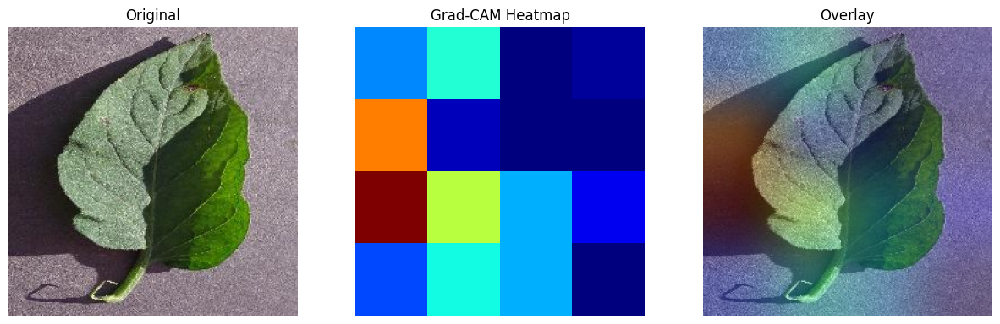

Processing Tomato__Tomato_mosaic_virus...


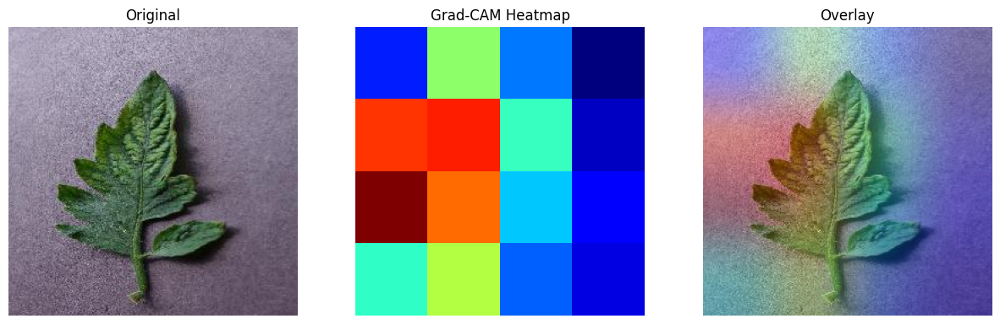

Processing Tomato__Tomato_YellowLeaf__Curl_Virus...


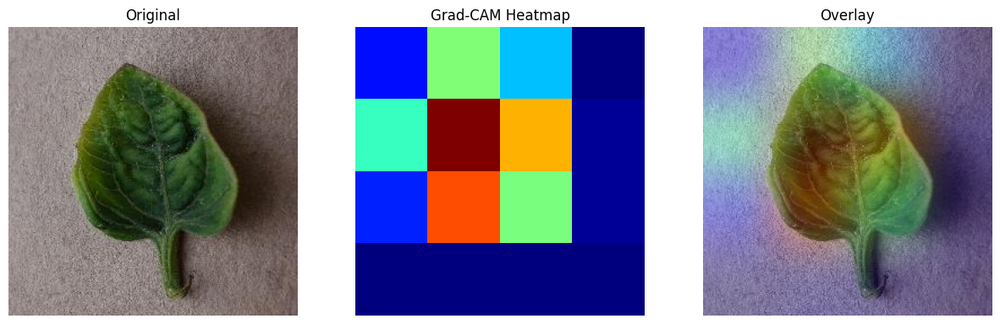

In [24]:
# #Implementing GRAD Cam for Feature Visualization

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # Assuming model is Sequential and layer 0 is the base model (MobileNetV2)
    base_model = model.layers[0]
    last_conv_layer = base_model.get_layer(last_conv_layer_name)
    
    # Create a model that outputs the conv layer output and the base model output
    base_model_out = tf.keras.models.Model(base_model.inputs, [last_conv_layer.output, base_model.output])
    
    # Create a new functional model that mimics the full model but outputs conv layer too
    inputs = tf.keras.Input(shape=model.input_shape[1:])
    conv_out, base_out = base_model_out(inputs)
    
    x = base_out
    for layer in model.layers[1:]:
        x = layer(x)
        
    grad_model = tf.keras.models.Model(inputs, [conv_out, x])
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


def display_gradcam_subplot(img_path, heatmap, alpha=0.4):
    # Load original image
    img = image.load_img(img_path)
    img_array = image.img_to_array(img)

    # Create heatmap (color)
    heatmap_uint8 = np.uint8(255 * heatmap)
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap_uint8]
    jet_heatmap_img = image.array_to_img(jet_heatmap).resize((img_array.shape[1], img_array.shape[0]))
    jet_heatmap_array = image.img_to_array(jet_heatmap_img)

    # Overlay
    overlay = image.array_to_img(jet_heatmap_array * alpha + img_array)

    # Plot
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    axs[0].imshow(img_array.astype("uint8"))
    axs[0].set_title("Original")
    axs[0].axis("off")

    axs[1].imshow(heatmap, cmap="jet")
    axs[1].set_title("Grad-CAM Heatmap")
    axs[1].axis("off")

    axs[2].imshow(overlay)
    axs[2].set_title("Overlay")
    axs[2].axis("off")

    plt.show()



# Load model
model_path = 'plantvillage_model.keras'
if not os.path.exists(model_path):
    if os.path.exists('cnn_model.h5'):
        model_path = 'cnn_model.h5'
if os.path.exists(model_path):
    try:
        model = tf.keras.models.load_model(model_path)
        print(f"Model loaded successfully from {model_path}")
        
        # Check model input shape
        input_shape = model.input_shape
        if input_shape and len(input_shape) > 2 and input_shape[1] is not None:
            img_size = (input_shape[1], input_shape[2])
        else:
            img_size = (128, 128) # Fallback
            
        # Target layer for MobileNetV2
        last_conv_layer_name = "out_relu"
        
        # Base directory
        base_dir = "PV"
        
        if os.path.exists(base_dir):
            classes = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
            
            for class_name in classes:
                class_dir = os.path.join(base_dir, class_name)
                images = glob.glob(os.path.join(class_dir, "*.JPG")) + glob.glob(os.path.join(class_dir, "*.jpg"))
                
                if images:
                    img_path = images[0]
                    print(f"Processing {class_name}...")
                    
                    # Prepare image
                    img = image.load_img(img_path, target_size=img_size)
                    img_array = image.img_to_array(img)
                    img_array = np.expand_dims(img_array, axis=0)
                    img_array = preprocess_input(img_array)
                    # Generate heatmap
                    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
                    # Display
                    display_gradcam_subplot(img_path, heatmap)
        else:
            print(f"Directory not found: {base_dir}")
    except Exception as e:
        print(f"Error executing Grad-CAM: {e}")
else:
    print(f"Model not found: {model_path}")



## Summary

### Data Preprocessing
All images underwent several preprocessing steps to improve quality and prepare them for model training:  
- **Data augmentation**, **image resizing**, and **normalization** were applied for the CNN model.  
- For classical machine-learning models, **hand-crafted features** such as **color histograms** were extracted and used as inputs.

### Classical Models
The classical algorithms evaluated included:  
- Support Vector Machine (SVM)  
- Random Forest (RF)  
- K-Nearest Neighbors (KNN)

### CNN Model
A deep-learning model based on **MobileNetV2** was trained for image classification.

### Model Comparison
The CNN outperformed all classical models:  
- **MobileNetV2 achieved the highest accuracy: 95.11%.**  
- The best classical model, **Random Forest**, reached **93.95% accuracy**.

### SHAP Analysis
Grad-SHAP was used to interpret the CNN’s predictions by highlighting the most influential regions in the images.  
- The CNN generally focused on appropriate lesion areas, indicating reliable prediction behavior.  
- In some cases—particularly for healthy leaves or images with minimal lesions—SHAP highlighted inconsistent regions influenced by **reflections, shadows, or folds**, where the model had less clear lesion patterns to rely on.
